## 1. Setup

In [ ]:
# Mount google drive
from google.colab import drive
drive.mount('/content/drive')

!pip install selectivesearch
!pip install torch torchvision

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.transforms import functional as FT
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2
from selectivesearch import selective_search
import matplotlib.patches as patches
import time
from contextlib import contextmanager


Mounted at /content/drive
  Preparing metadata (setup.py) ... done
  Created wheel for selectivesearch: filename=selectivesearch-0.4-py3-none-any.whl size=4335 sha256=1119a1b825d3cf5f1244ef8a7d55b9c6ed6d4fc27d683d155d3a0018d6ddfcc6
  Stored in directory: /root/.cache/pip/wheels/0e/49/95/01447a4e0f48a135ac91fbdb1dd2a1c0523e40e29957b383a3
Successfully built selectivesearch


## 2. Workspace

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Processing image: /content/drive/MyDrive/CS5330/DeepLearningTalk/cat.jpg
R-CNN Pipeline Demonstration:
1. Generating region proposals using Selective Search...


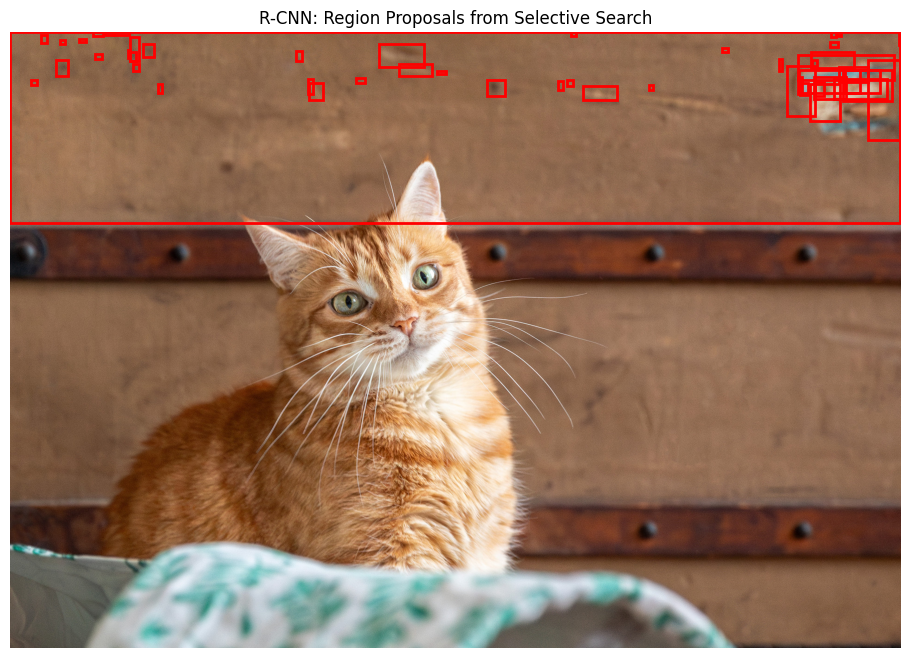


Fast R-CNN Pipeline Demonstration:
1. Single forward pass through CNN...
2. RoI Pooling for each region...


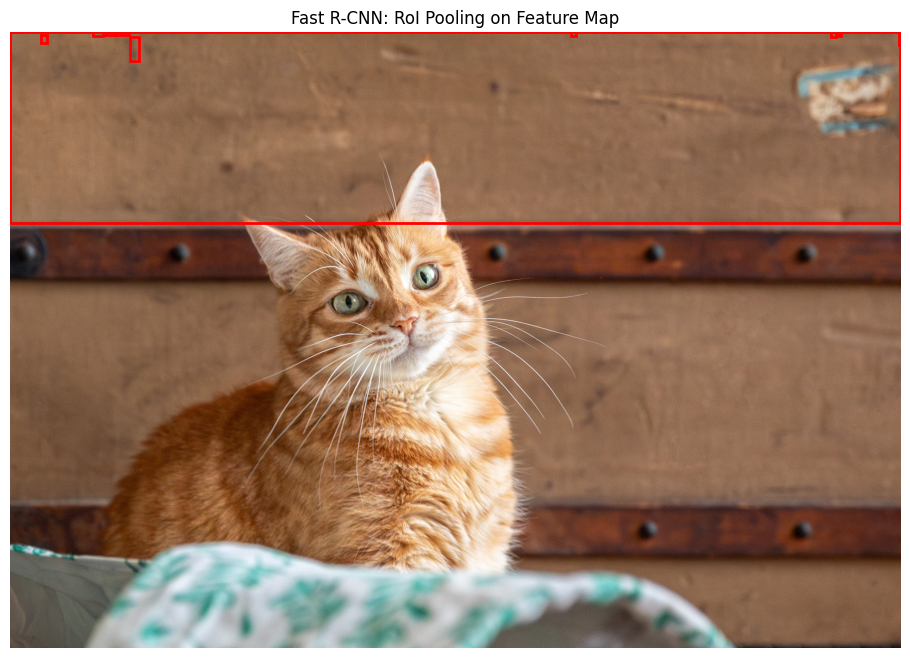


Faster R-CNN Pipeline Demonstration:


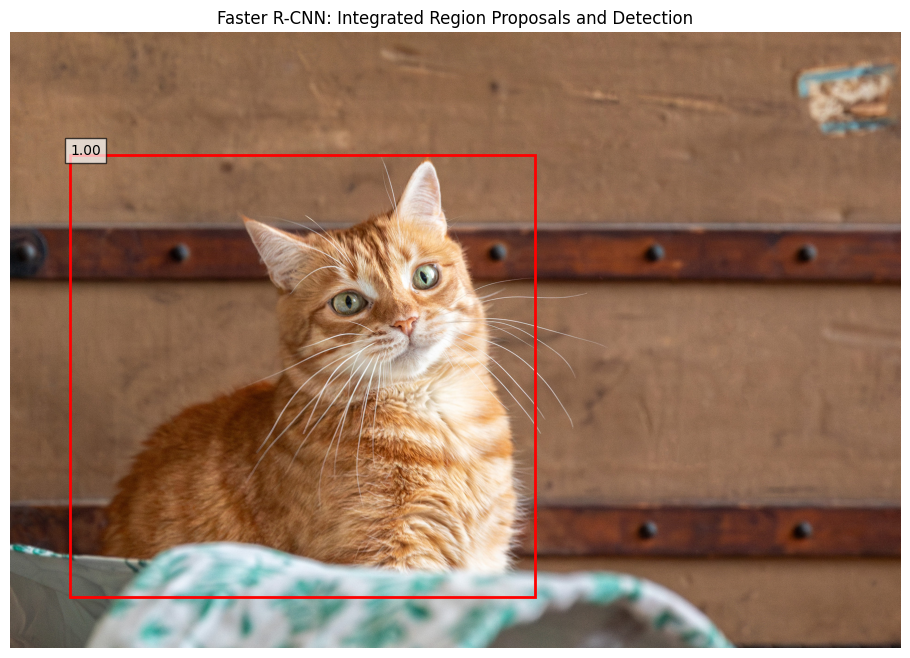


Comparison complete!


Processing image: /content/drive/MyDrive/CS5330/DeepLearningTalk/dog.jpg
R-CNN Pipeline Demonstration:
1. Generating region proposals using Selective Search...


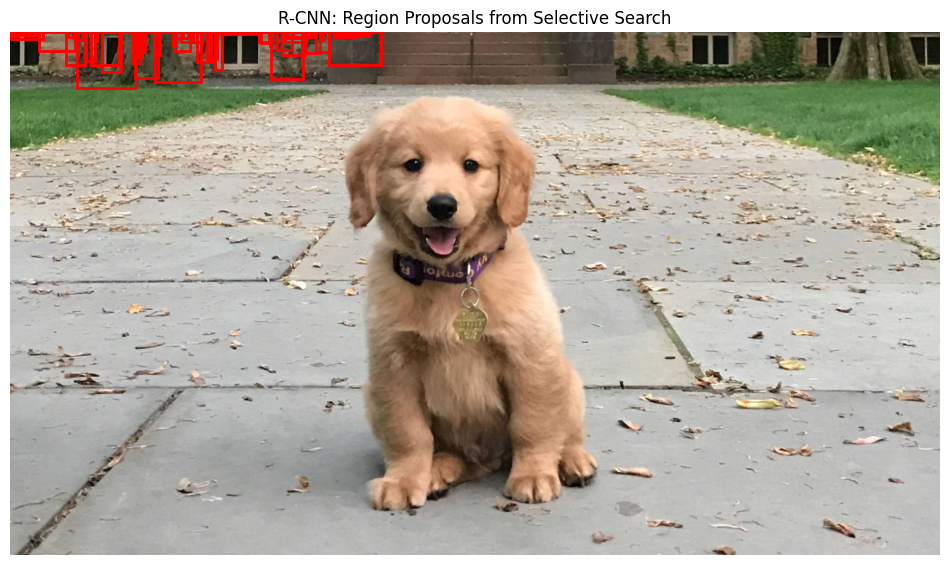


Fast R-CNN Pipeline Demonstration:
1. Single forward pass through CNN...
2. RoI Pooling for each region...


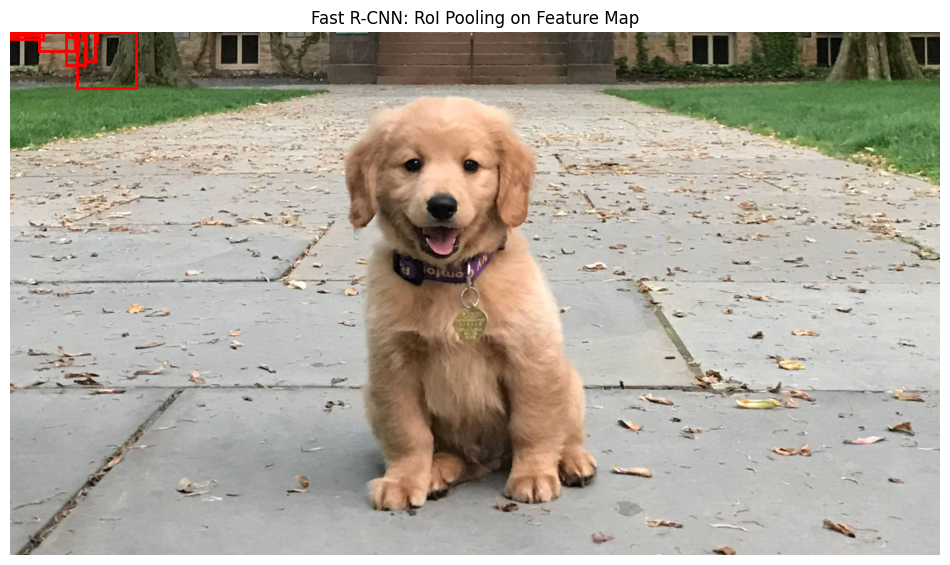


Faster R-CNN Pipeline Demonstration:


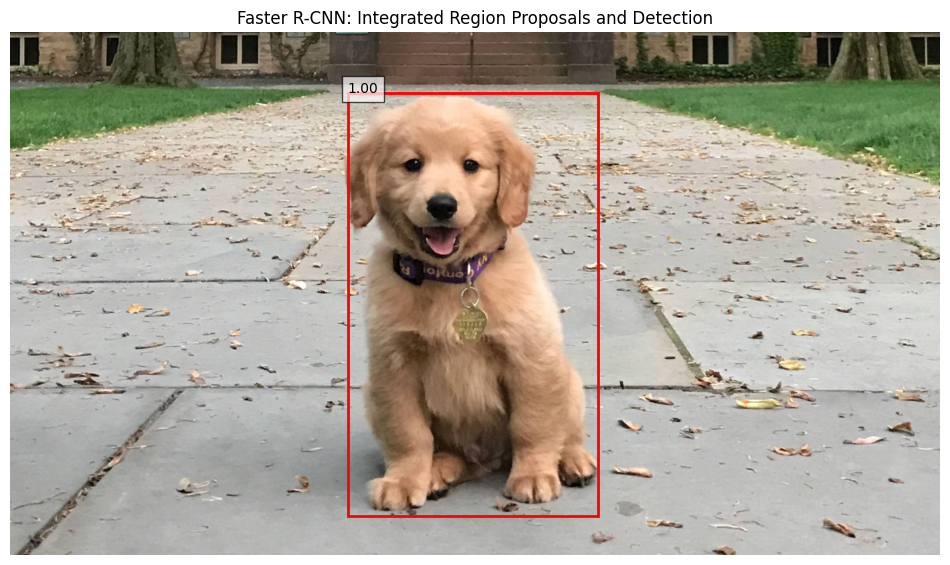


Comparison complete!


Processing image: /content/drive/MyDrive/CS5330/DeepLearningTalk/dogNcat.jpg
R-CNN Pipeline Demonstration:
1. Generating region proposals using Selective Search...


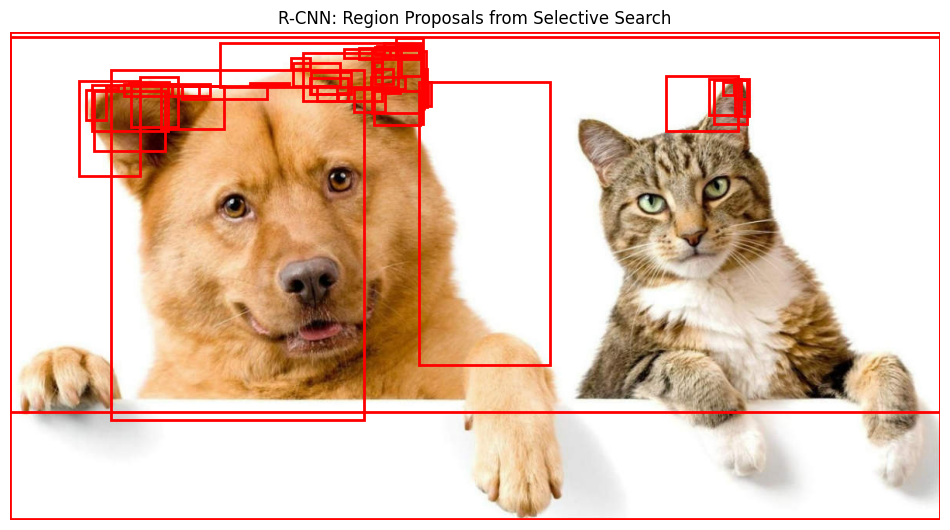


Fast R-CNN Pipeline Demonstration:
1. Single forward pass through CNN...
2. RoI Pooling for each region...


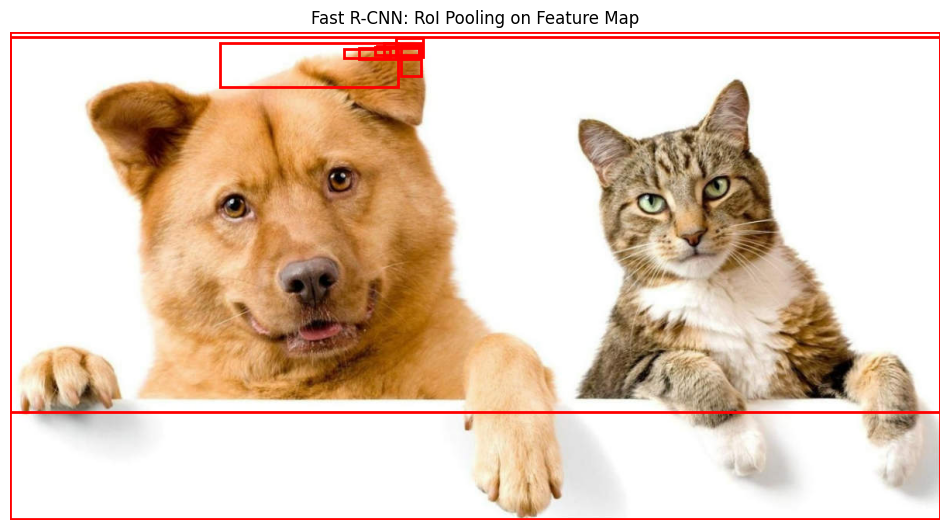


Faster R-CNN Pipeline Demonstration:


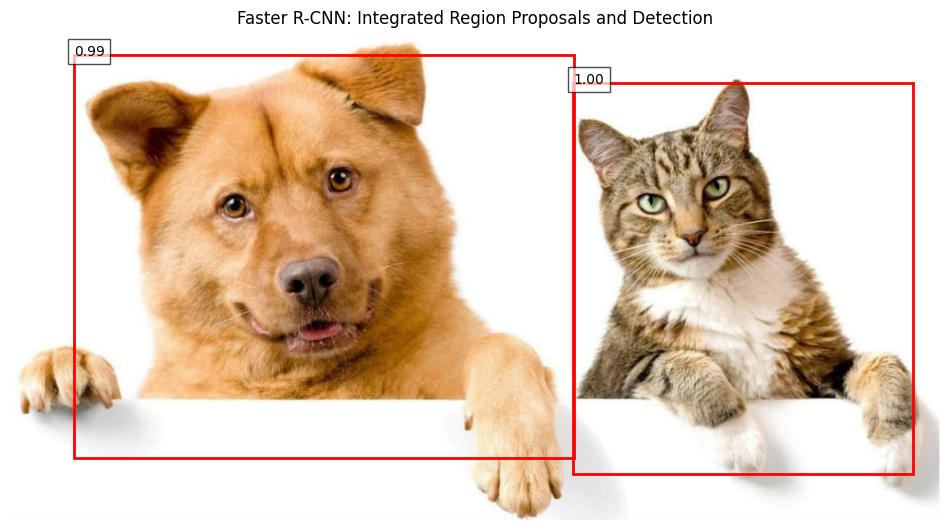


Comparison complete!


Processing image: /content/drive/MyDrive/CS5330/DeepLearningTalk/dogNcat3.jpg
R-CNN Pipeline Demonstration:
1. Generating region proposals using Selective Search...


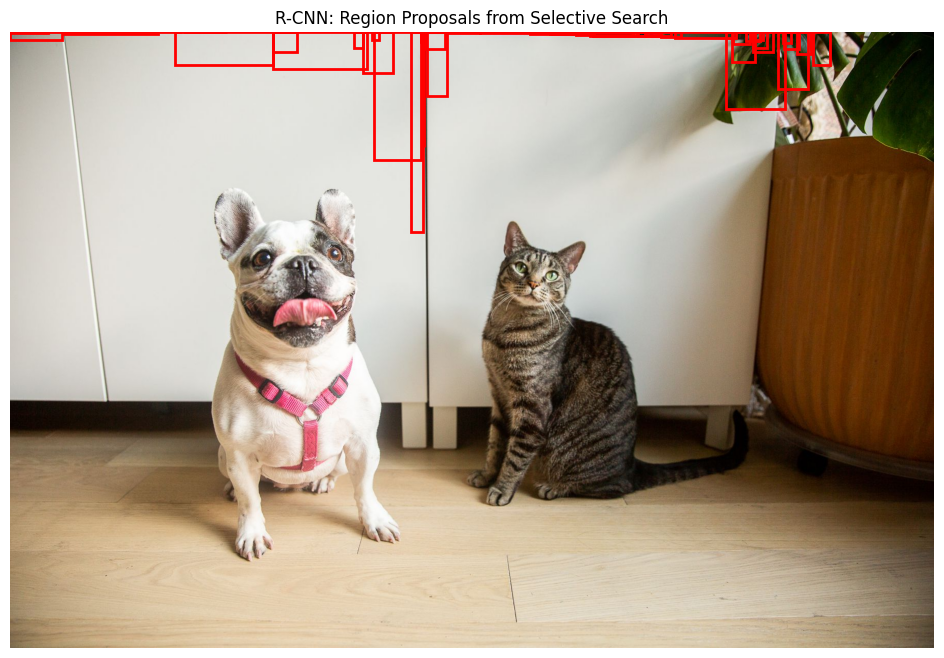


Fast R-CNN Pipeline Demonstration:
1. Single forward pass through CNN...
2. RoI Pooling for each region...


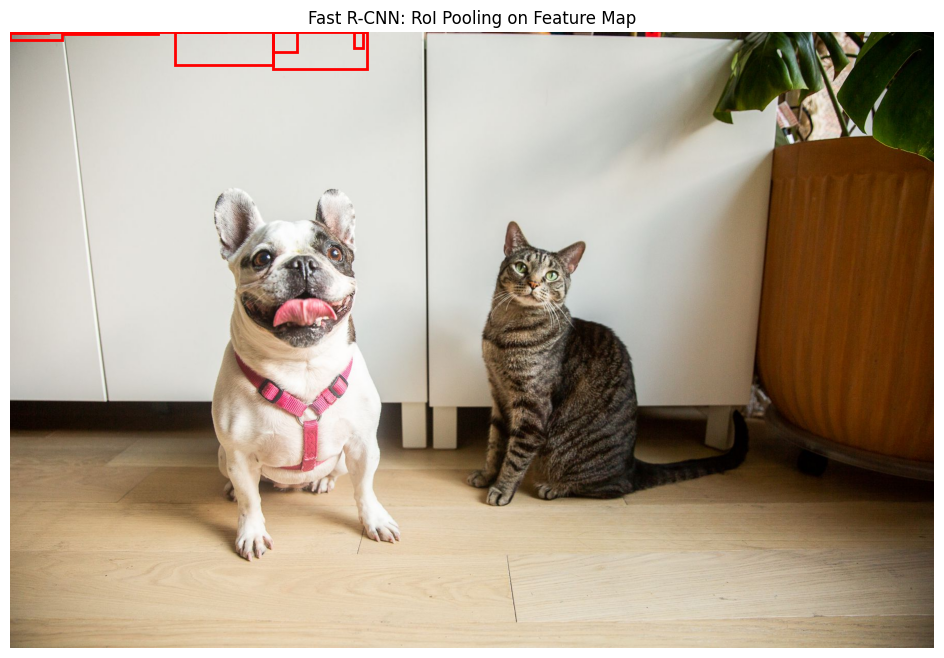


Faster R-CNN Pipeline Demonstration:


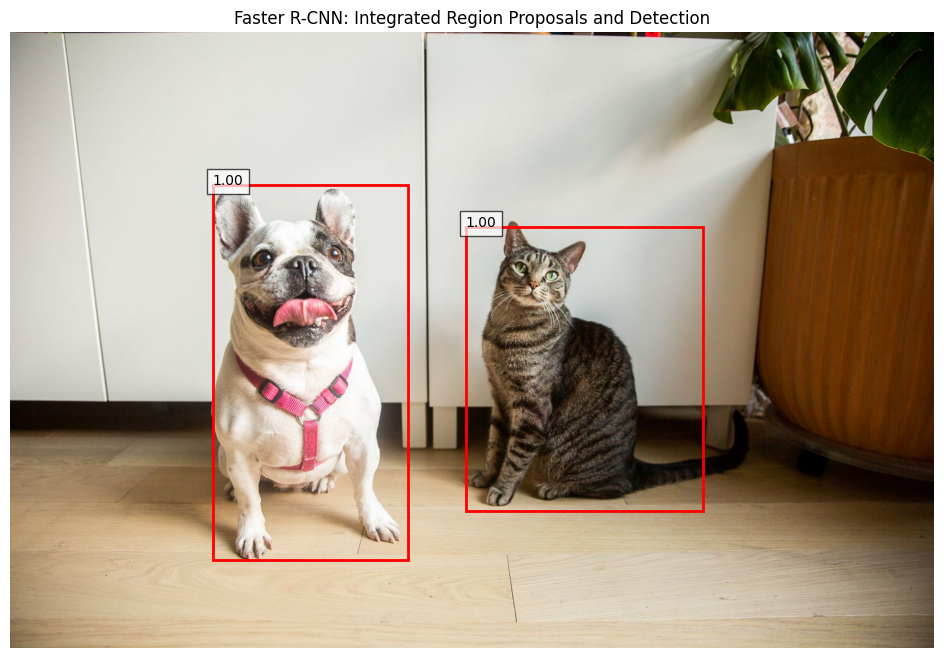


Comparison complete!


Processing image: /content/drive/MyDrive/CS5330/DeepLearningTalk/dogNcat2.jpg
R-CNN Pipeline Demonstration:
1. Generating region proposals using Selective Search...


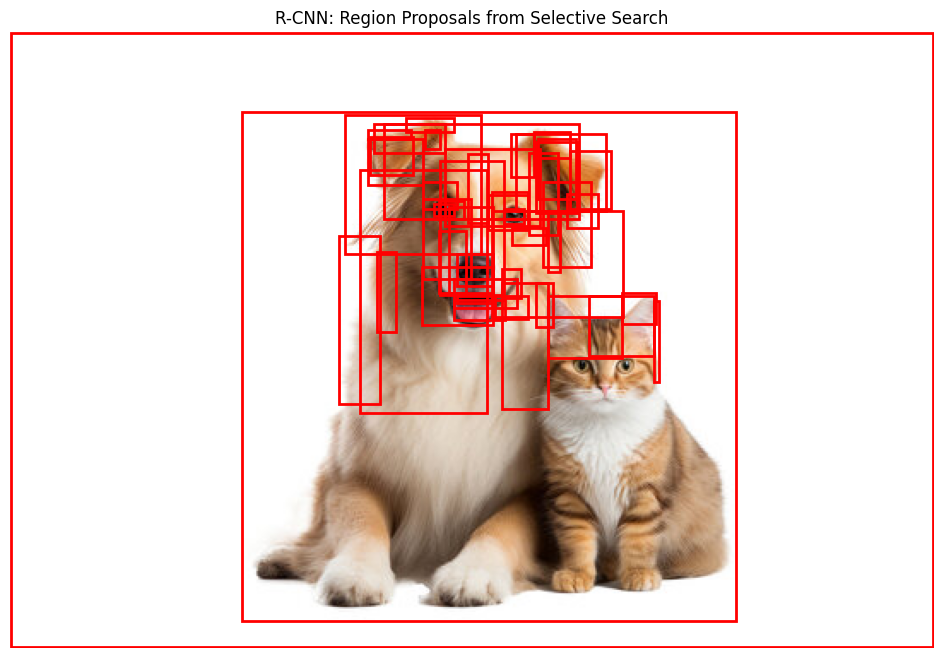


Fast R-CNN Pipeline Demonstration:
1. Single forward pass through CNN...
2. RoI Pooling for each region...


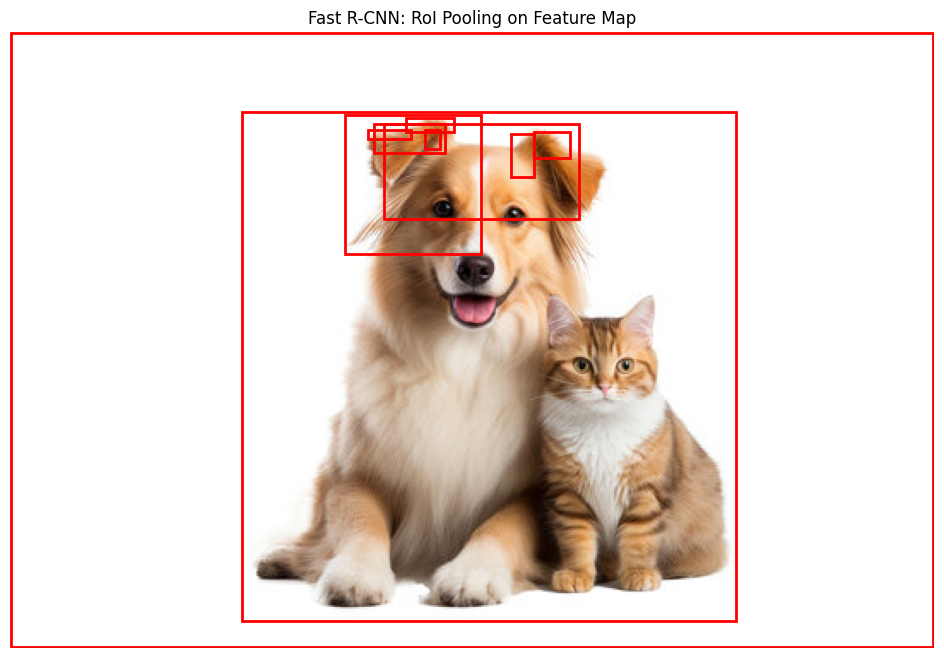


Faster R-CNN Pipeline Demonstration:


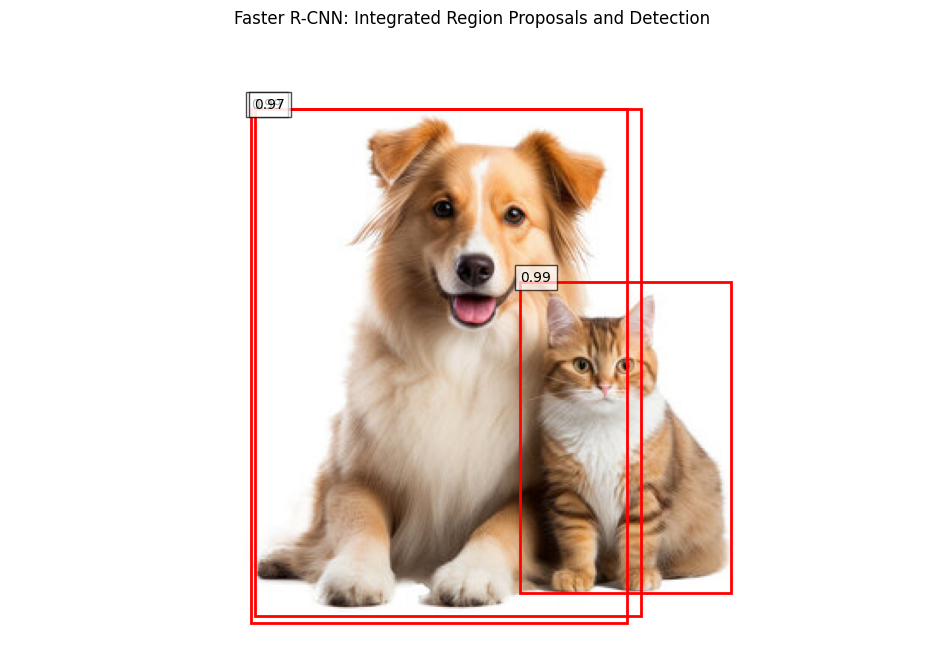


Comparison complete!




In [ ]:
img_paths = [
    '/content/drive/MyDrive/CS5330/DeepLearningTalk/cat.jpg',
    '/content/drive/MyDrive/CS5330/DeepLearningTalk/dog.jpg',
    '/content/drive/MyDrive/CS5330/DeepLearningTalk/dogNcat.jpg',
    '/content/drive/MyDrive/CS5330/DeepLearningTalk/dogNcat3.jpg',
    '/content/drive/MyDrive/CS5330/DeepLearningTalk/dogNcat2.jpg',
    # '/content/drive/MyDrive/CS5330/DeepLearningTalk/animals.jpg',
]

def load_and_prepare_image(img_path):
    """Load and prepare image for processing"""
    image = Image.open(img_path)
    # Convert to RGB if needed
    if image.mode != 'RGB':
        image = image.convert('RGB')
    return image

def plot_image_with_boxes(image, boxes, title="", scores=None, threshold=0.5):
    """Plot image with bounding boxes and optional scores"""
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image)

    # Convert PIL image to numpy if needed
    if isinstance(image, Image.Image):
        image = np.array(image)

    for idx, box in enumerate(boxes):
        if scores is None or scores[idx] >= threshold:
            x1, y1, x2, y2 = box
            rect = patches.Rectangle(
                (x1, y1), x2-x1, y2-y1,
                linewidth=2, edgecolor='r', facecolor='none'
            )
            ax.add_patch(rect)

            # Add score if available
            if scores is not None:
                plt.text(x1, y1, f'{scores[idx]:.2f}',
                        bbox=dict(facecolor='white', alpha=0.7))

    plt.title(title)
    plt.axis('off')
    plt.show()

class RCNNDemo:
    def __init__(self):
        # Load pre-trained ResNet model for feature extraction
        self.feature_extractor = torchvision.models.resnet50(pretrained=True)
        self.feature_extractor = nn.Sequential(*list(self.feature_extractor.children())[:-1])
        self.feature_extractor.eval()

    def get_regions(self, image):
        """Get region proposals using selective search"""
        # Convert PIL to opencv format
        img = np.array(image)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

        # Perform selective search
        _, regions = selective_search(
            img_rgb, scale=100, sigma=0.8, min_size=50)

        # Convert regions to boxes
        boxes = []
        for r in regions[:50]:  # Limit to top 50 regions for demonstration
            x, y, w, h = r['rect']
            boxes.append([x, y, x+w, y+h])

        return np.array(boxes)

    def demonstrate(self, image_path):
        """Demonstrate R-CNN pipeline"""
        print("R-CNN Pipeline Demonstration:")
        image = load_and_prepare_image(image_path)

        # 1. Region Proposals
        print("1. Generating region proposals using Selective Search...")
        boxes = self.get_regions(image)
        plot_image_with_boxes(image, boxes, "R-CNN: Region Proposals from Selective Search")

        return boxes

class FastRCNNDemo:
    def __init__(self):
        # Load pre-trained backbone
        self.backbone = torchvision.models.vgg16(pretrained=True).features
        self.backbone.eval()

    def demonstrate(self, image_path, rcnn_boxes):
        """Demonstrate Fast R-CNN pipeline"""
        print("\nFast R-CNN Pipeline Demonstration:")
        image = load_and_prepare_image(image_path)

        # 1. Single Forward Pass
        print("1. Single forward pass through CNN...")
        # Convert image to tensor and add batch dimension
        img_tensor = FT.to_tensor(image).unsqueeze(0)
        feature_map = self.backbone(img_tensor)

        # 2. RoI Pooling (simplified visualization)
        print("2. RoI Pooling for each region...")
        plot_image_with_boxes(image, rcnn_boxes[:10],
                            "Fast R-CNN: RoI Pooling on Feature Map")

        return feature_map

class FasterRCNNDemo:
    def __init__(self):
        # Load pre-trained Faster R-CNN
        self.model = fasterrcnn_resnet50_fpn(pretrained=True)
        self.model.eval()

    def demonstrate(self, image_path):
        """Demonstrate Faster R-CNN pipeline"""
        print("\nFaster R-CNN Pipeline Demonstration:")
        image = load_and_prepare_image(image_path)

        # Convert to tensor
        img_tensor = FT.to_tensor(image).unsqueeze(0)

        # Get predictions
        with torch.no_grad():
            predictions = self.model(img_tensor)

        # Get boxes and scores
        boxes = predictions[0]['boxes'].cpu().numpy()
        scores = predictions[0]['scores'].cpu().numpy()

        # Plot results
        plot_image_with_boxes(image, boxes,
                            "Faster R-CNN: Integrated Region Proposals and Detection",
                            scores, threshold=0.95)

        return boxes, scores

def compare_architectures(img_path):
    """Compare all three architectures on a single image"""
    print(f"Processing image: {img_path}")

    # Initialize models
    rcnn_demo = RCNNDemo()
    fast_rcnn_demo = FastRCNNDemo()
    faster_rcnn_demo = FasterRCNNDemo()

    # Run demonstrations
    rcnn_boxes = rcnn_demo.demonstrate(img_path)
    fast_rcnn_demo.demonstrate(img_path, rcnn_boxes)
    faster_rcnn_demo.demonstrate(img_path)

    print("\nComparison complete!")

# Run comparison for each image
for img_path in img_paths:
    compare_architectures(img_path)
    print("\n" + "="*50 + "\n")

Processing image: /content/drive/MyDrive/CS5330/DeepLearningTalk/animals.jpg
R-CNN Pipeline Demonstration:
1. Generating region proposals using Selective Search...


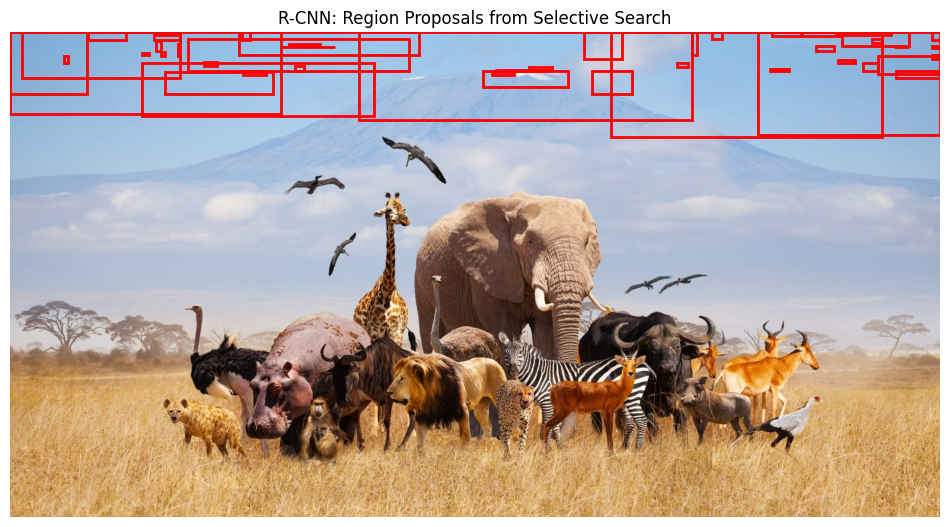


Fast R-CNN Pipeline Demonstration:
1. Single forward pass through CNN...
2. RoI Pooling for each region...


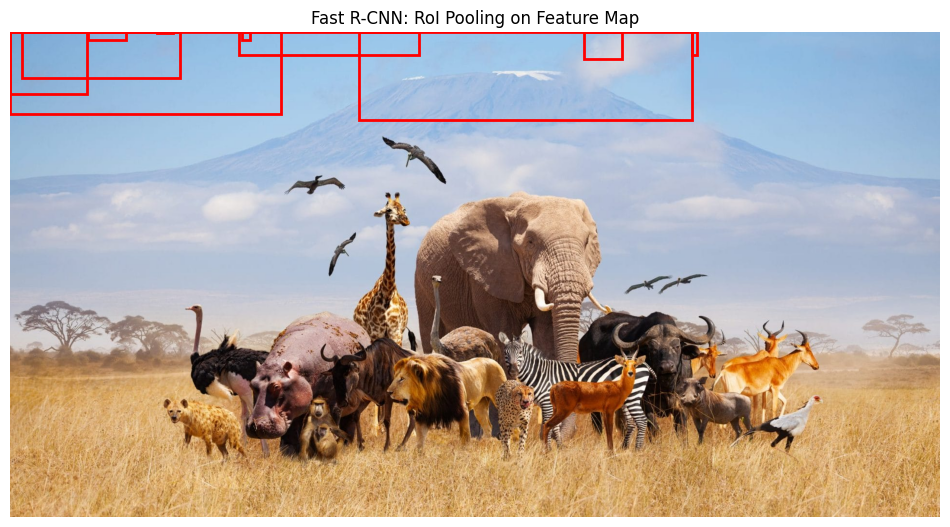


Faster R-CNN Pipeline Demonstration:


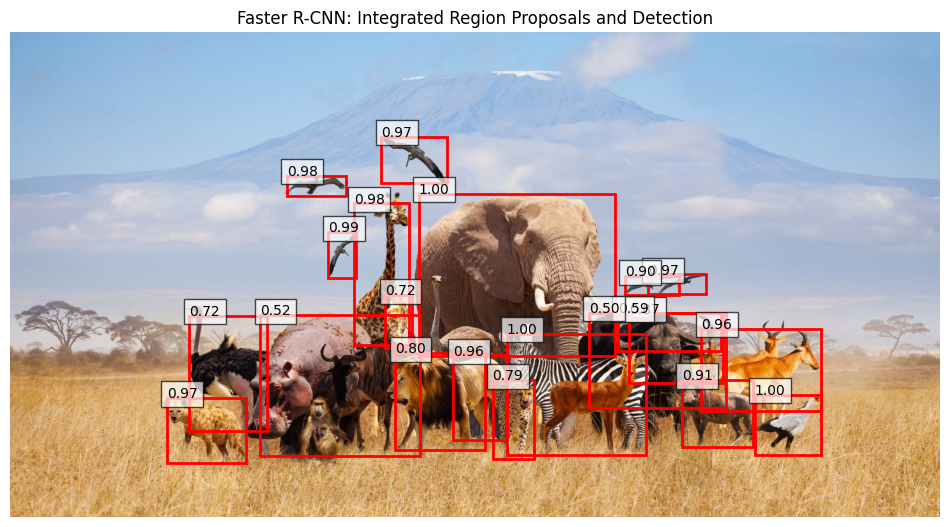


Comparison complete!




In [ ]:
# only for the animals img to set threshold to be 0.5


img_paths = [
    '/content/drive/MyDrive/CS5330/DeepLearningTalk/animals.jpg',
]

def load_and_prepare_image(img_path):
    """Load and prepare image for processing"""
    image = Image.open(img_path)
    # Convert to RGB if needed
    if image.mode != 'RGB':
        image = image.convert('RGB')
    return image

def plot_image_with_boxes(image, boxes, title="", scores=None, threshold=0.5):
    """Plot image with bounding boxes and optional scores"""
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image)

    # Convert PIL image to numpy if needed
    if isinstance(image, Image.Image):
        image = np.array(image)

    for idx, box in enumerate(boxes):
        if scores is None or scores[idx] >= threshold:
            x1, y1, x2, y2 = box
            rect = patches.Rectangle(
                (x1, y1), x2-x1, y2-y1,
                linewidth=2, edgecolor='r', facecolor='none'
            )
            ax.add_patch(rect)

            # Add score if available
            if scores is not None:
                plt.text(x1, y1, f'{scores[idx]:.2f}',
                        bbox=dict(facecolor='white', alpha=0.7))

    plt.title(title)
    plt.axis('off')
    plt.show()

class RCNNDemo:
    def __init__(self):
        # Load pre-trained ResNet model for feature extraction
        self.feature_extractor = torchvision.models.resnet50(pretrained=True)
        self.feature_extractor = nn.Sequential(*list(self.feature_extractor.children())[:-1])
        self.feature_extractor.eval()

    def get_regions(self, image):
        """Get region proposals using selective search"""
        # Convert PIL to opencv format
        img = np.array(image)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

        # Perform selective search
        _, regions = selective_search(
            img_rgb, scale=100, sigma=0.8, min_size=50)

        # Convert regions to boxes
        boxes = []
        for r in regions[:50]:  # Limit to top 50 regions for demonstration
            x, y, w, h = r['rect']
            boxes.append([x, y, x+w, y+h])

        return np.array(boxes)

    def demonstrate(self, image_path):
        """Demonstrate R-CNN pipeline"""
        print("R-CNN Pipeline Demonstration:")
        image = load_and_prepare_image(image_path)

        # 1. Region Proposals
        print("1. Generating region proposals using Selective Search...")
        boxes = self.get_regions(image)
        plot_image_with_boxes(image, boxes, "R-CNN: Region Proposals from Selective Search")

        return boxes

class FastRCNNDemo:
    def __init__(self):
        # Load pre-trained backbone
        self.backbone = torchvision.models.vgg16(pretrained=True).features
        self.backbone.eval()

    def demonstrate(self, image_path, rcnn_boxes):
        """Demonstrate Fast R-CNN pipeline"""
        print("\nFast R-CNN Pipeline Demonstration:")
        image = load_and_prepare_image(image_path)

        # 1. Single Forward Pass
        print("1. Single forward pass through CNN...")
        # Convert image to tensor and add batch dimension
        img_tensor = FT.to_tensor(image).unsqueeze(0)
        feature_map = self.backbone(img_tensor)

        # 2. RoI Pooling (simplified visualization)
        print("2. RoI Pooling for each region...")
        plot_image_with_boxes(image, rcnn_boxes[:10],
                            "Fast R-CNN: RoI Pooling on Feature Map")

        return feature_map

class FasterRCNNDemo:
    def __init__(self):
        # Load pre-trained Faster R-CNN
        self.model = fasterrcnn_resnet50_fpn(pretrained=True)
        self.model.eval()

    def demonstrate(self, image_path):
        """Demonstrate Faster R-CNN pipeline"""
        print("\nFaster R-CNN Pipeline Demonstration:")
        image = load_and_prepare_image(image_path)

        # Convert to tensor
        img_tensor = FT.to_tensor(image).unsqueeze(0)

        # Get predictions
        with torch.no_grad():
            predictions = self.model(img_tensor)

        # Get boxes and scores
        boxes = predictions[0]['boxes'].cpu().numpy()
        scores = predictions[0]['scores'].cpu().numpy()

        # Plot results
        plot_image_with_boxes(image, boxes,
                            "Faster R-CNN: Integrated Region Proposals and Detection",
                            scores, threshold=0.5)

        return boxes, scores

def compare_architectures(img_path):
    """Compare all three architectures on a single image"""
    print(f"Processing image: {img_path}")

    # Initialize models
    rcnn_demo = RCNNDemo()
    fast_rcnn_demo = FastRCNNDemo()
    faster_rcnn_demo = FasterRCNNDemo()

    # Run demonstrations
    rcnn_boxes = rcnn_demo.demonstrate(img_path)
    fast_rcnn_demo.demonstrate(img_path, rcnn_boxes)
    faster_rcnn_demo.demonstrate(img_path)

    print("\nComparison complete!")

# Run comparison for each image
for img_path in img_paths:
    compare_architectures(img_path)
    print("\n" + "="*50 + "\n")




Processing image: /content/drive/MyDrive/CS5330/DeepLearningTalk/animals.jpg
RCNN - Loading ResNet model: 0.5064 seconds
Fast RCNN - Loading VGG16 model: 1.8467 seconds
Faster RCNN - Loading model: 0.9031 seconds
Total initialization time: 3.2576 seconds
R-CNN Pipeline Demonstration:
RCNN - Loading and preparing image: 0.0033 seconds


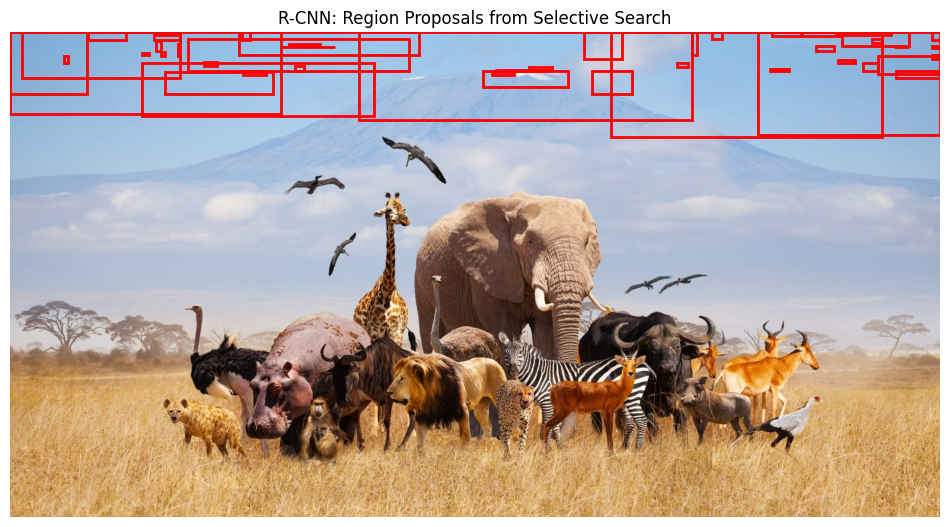

RCNN - Full pipeline: 93.6070 seconds
Total RCNN time: 93.6109 seconds

Fast R-CNN Pipeline Demonstration:
Fast RCNN - Loading and preparing image: 0.0077 seconds
Fast RCNN - Feature extraction: 25.0826 seconds


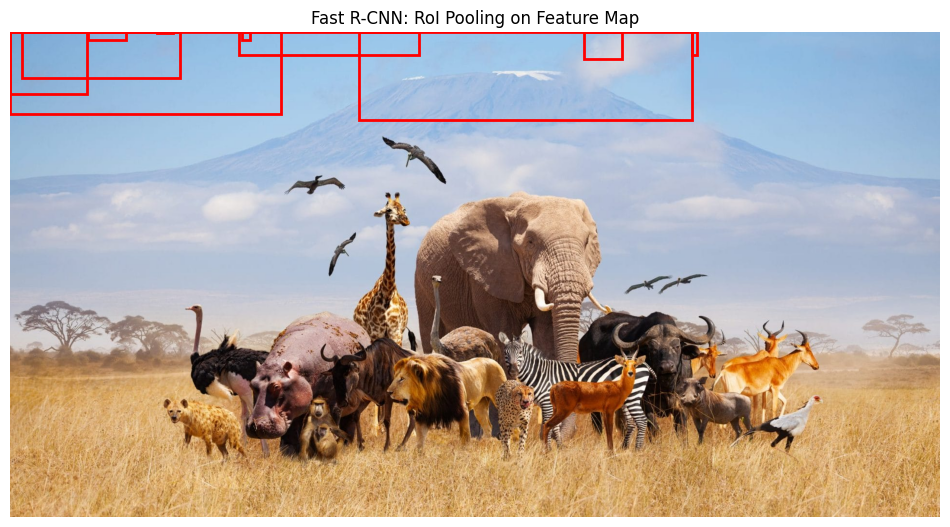

Fast RCNN - RoI pooling visualization: 0.6676 seconds
Total Fast RCNN time: 26.1501 seconds

Faster R-CNN Pipeline Demonstration:
Faster RCNN - Loading and preparing image: 0.0047 seconds
Faster RCNN - Full inference: 9.0042 seconds


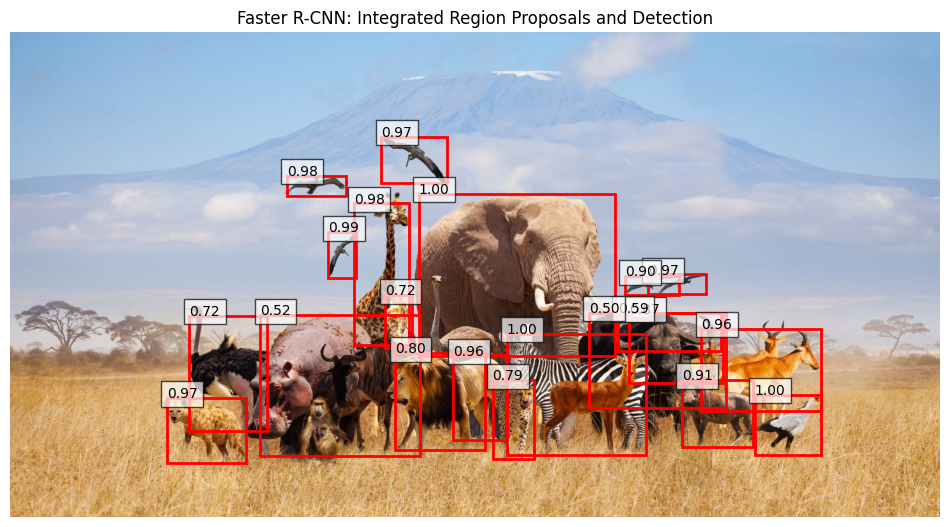

Faster RCNN - Visualization: 1.1114 seconds
Total Faster RCNN time: 10.1235 seconds

Comparison complete!

=== Timing Summary ===

RCNN:
  Region Proposals: 92.9030s (avg over 1 runs)


In [ ]:
img_paths = [
    '/content/drive/MyDrive/CS5330/DeepLearningTalk/animals.jpg',
]

@contextmanager
def timer(description):
    """Context manager for timing code blocks"""
    start = time.perf_counter()
    yield
    elapsed = time.perf_counter() - start
    print(f"{description}: {elapsed:.4f} seconds")

class TimingStats:
    def __init__(self):
        self.stats = {}

    def add_timing(self, model, step, time):
        if model not in self.stats:
            self.stats[model] = {}
        if step not in self.stats[model]:
            self.stats[model][step] = []
        self.stats[model][step].append(time)

    def print_summary(self):
        print("\n=== Timing Summary ===")
        for model in self.stats:
            print(f"\n{model}:")
            for step, times in self.stats[model].items():
                avg_time = sum(times) / len(times)
                print(f"  {step}: {avg_time:.4f}s (avg over {len(times)} runs)")

timing_stats = TimingStats()

class RCNNDemo:
    def __init__(self):
        with timer("RCNN - Loading ResNet model"):
            self.feature_extractor = torchvision.models.resnet50(pretrained=True)
            self.feature_extractor = nn.Sequential(*list(self.feature_extractor.children())[:-1])
            self.feature_extractor.eval()

    def get_regions(self, image):
        """Get region proposals using selective search"""
        start_time = time.perf_counter()

        img = np.array(image)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

        _, regions = selective_search(img_rgb, scale=100, sigma=0.8, min_size=50)

        boxes = []
        for r in regions[:50]:
            x, y, w, h = r['rect']
            boxes.append([x, y, x+w, y+h])

        elapsed = time.perf_counter() - start_time
        timing_stats.add_timing("RCNN", "Region Proposals", elapsed)

        return np.array(boxes)

    def demonstrate(self, image_path):
        print("R-CNN Pipeline Demonstration:")
        with timer("RCNN - Loading and preparing image"):
            image = load_and_prepare_image(image_path)

        with timer("RCNN - Full pipeline"):
            boxes = self.get_regions(image)
            plot_image_with_boxes(image, boxes, "R-CNN: Region Proposals from Selective Search")

        return boxes

class FastRCNNDemo:
    def __init__(self):
        with timer("Fast RCNN - Loading VGG16 model"):
            self.backbone = torchvision.models.vgg16(pretrained=True).features
            self.backbone.eval()

    def demonstrate(self, image_path, rcnn_boxes):
        print("\nFast R-CNN Pipeline Demonstration:")

        with timer("Fast RCNN - Loading and preparing image"):
            image = load_and_prepare_image(image_path)

        with timer("Fast RCNN - Feature extraction"):
            img_tensor = FT.to_tensor(image).unsqueeze(0)
            feature_map = self.backbone(img_tensor)

        with timer("Fast RCNN - RoI pooling visualization"):
            plot_image_with_boxes(image, rcnn_boxes[:10],
                                "Fast R-CNN: RoI Pooling on Feature Map")

        return feature_map

class FasterRCNNDemo:
    def __init__(self):
        with timer("Faster RCNN - Loading model"):
            self.model = fasterrcnn_resnet50_fpn(pretrained=True)
            self.model.eval()

    def demonstrate(self, image_path):
        print("\nFaster R-CNN Pipeline Demonstration:")

        with timer("Faster RCNN - Loading and preparing image"):
            image = load_and_prepare_image(image_path)

        with timer("Faster RCNN - Full inference"):
            img_tensor = FT.to_tensor(image).unsqueeze(0)
            with torch.no_grad():
                predictions = self.model(img_tensor)

            boxes = predictions[0]['boxes'].cpu().numpy()
            scores = predictions[0]['scores'].cpu().numpy()

        with timer("Faster RCNN - Visualization"):
            plot_image_with_boxes(image, boxes,
                                "Faster R-CNN: Integrated Region Proposals and Detection",
                                scores, threshold=0.5)

        return boxes, scores

def compare_architectures(img_path):
    print(f"\nProcessing image: {img_path}")

    # Initialize models
    with timer("Total initialization time"):
        rcnn_demo = RCNNDemo()
        fast_rcnn_demo = FastRCNNDemo()
        faster_rcnn_demo = FasterRCNNDemo()

    # Run demonstrations
    with timer("Total RCNN time"):
        rcnn_boxes = rcnn_demo.demonstrate(img_path)

    with timer("Total Fast RCNN time"):
        fast_rcnn_demo.demonstrate(img_path, rcnn_boxes)

    with timer("Total Faster RCNN time"):
        faster_rcnn_demo.demonstrate(img_path)

    print("\nComparison complete!")

# Run comparison for each image
for img_path in img_paths:
    compare_architectures(img_path)

# Print timing summary at the end
timing_stats.print_summary()

### 2.2 Fal

Processing image: /content/drive/MyDrive/CS5330/DeepLearningTalk/rice.png
R-CNN Pipeline Demonstration:
1. Generating region proposals using Selective Search...


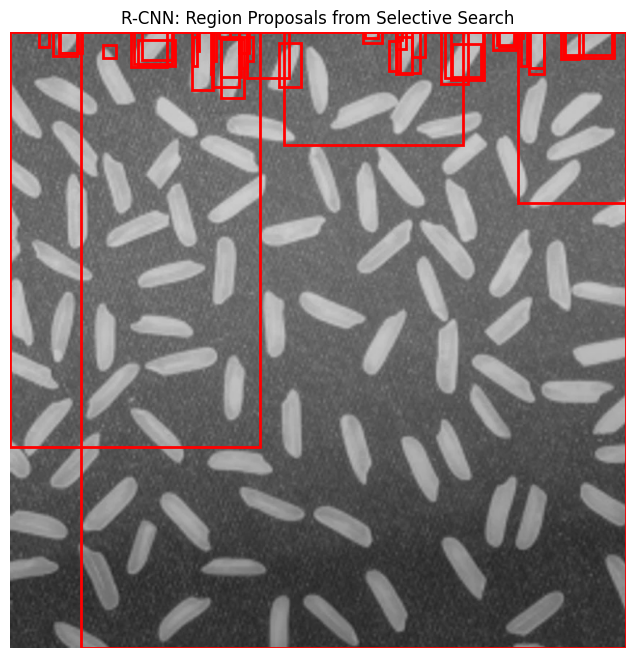


Fast R-CNN Pipeline Demonstration:
1. Single forward pass through CNN...
2. RoI Pooling for each region...


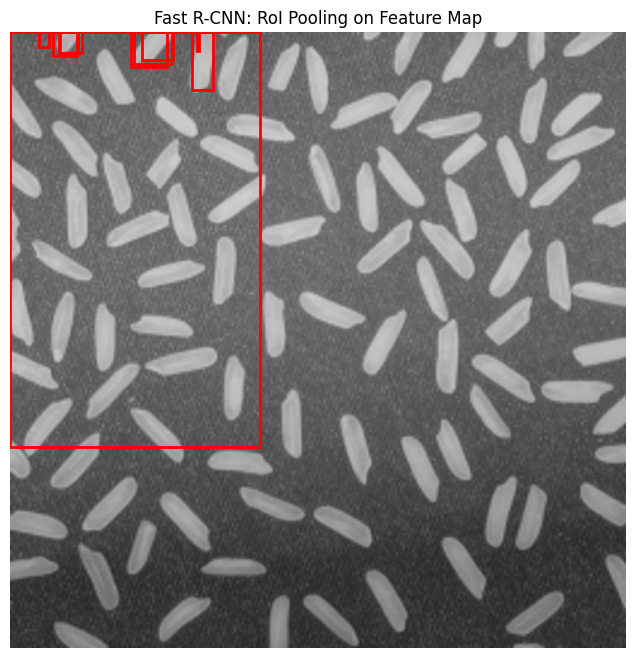


Faster R-CNN Pipeline Demonstration:


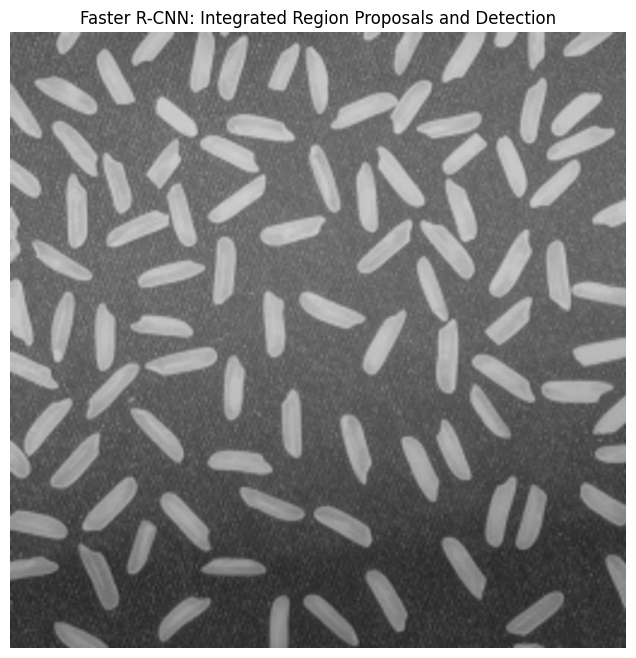


Comparison complete!




In [ ]:

img_paths = [
    '/content/drive/MyDrive/CS5330/DeepLearningTalk/rice.png',
]

def load_and_prepare_image(img_path):
    """Load and prepare image for processing"""
    image = Image.open(img_path)
    # Convert to RGB if needed
    if image.mode != 'RGB':
        image = image.convert('RGB')
    return image

def plot_image_with_boxes(image, boxes, title="", scores=None, threshold=0.5):
    """Plot image with bounding boxes and optional scores"""
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image)

    # Convert PIL image to numpy if needed
    if isinstance(image, Image.Image):
        image = np.array(image)

    for idx, box in enumerate(boxes):
        if scores is None or scores[idx] >= threshold:
            x1, y1, x2, y2 = box
            rect = patches.Rectangle(
                (x1, y1), x2-x1, y2-y1,
                linewidth=2, edgecolor='r', facecolor='none'
            )
            ax.add_patch(rect)

            # Add score if available
            if scores is not None:
                plt.text(x1, y1, f'{scores[idx]:.2f}',
                        bbox=dict(facecolor='white', alpha=0.7))

    plt.title(title)
    plt.axis('off')
    plt.show()

class RCNNDemo:
    def __init__(self):
        # Load pre-trained ResNet model for feature extraction
        self.feature_extractor = torchvision.models.resnet50(pretrained=True)
        self.feature_extractor = nn.Sequential(*list(self.feature_extractor.children())[:-1])
        self.feature_extractor.eval()

    def get_regions(self, image):
        """Get region proposals using selective search"""
        # Convert PIL to opencv format
        img = np.array(image)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

        # Perform selective search
        _, regions = selective_search(
            img_rgb, scale=100, sigma=0.8, min_size=50)

        # Convert regions to boxes
        boxes = []
        for r in regions[:50]:  # Limit to top 50 regions for demonstration
            x, y, w, h = r['rect']
            boxes.append([x, y, x+w, y+h])

        return np.array(boxes)

    def demonstrate(self, image_path):
        """Demonstrate R-CNN pipeline"""
        print("R-CNN Pipeline Demonstration:")
        image = load_and_prepare_image(image_path)

        # 1. Region Proposals
        print("1. Generating region proposals using Selective Search...")
        boxes = self.get_regions(image)
        plot_image_with_boxes(image, boxes, "R-CNN: Region Proposals from Selective Search")

        return boxes

class FastRCNNDemo:
    def __init__(self):
        # Load pre-trained backbone
        self.backbone = torchvision.models.vgg16(pretrained=True).features
        self.backbone.eval()

    def demonstrate(self, image_path, rcnn_boxes):
        """Demonstrate Fast R-CNN pipeline"""
        print("\nFast R-CNN Pipeline Demonstration:")
        image = load_and_prepare_image(image_path)

        # 1. Single Forward Pass
        print("1. Single forward pass through CNN...")
        # Convert image to tensor and add batch dimension
        img_tensor = FT.to_tensor(image).unsqueeze(0)
        feature_map = self.backbone(img_tensor)

        # 2. RoI Pooling (simplified visualization)
        print("2. RoI Pooling for each region...")
        plot_image_with_boxes(image, rcnn_boxes[:10],
                            "Fast R-CNN: RoI Pooling on Feature Map")

        return feature_map

class FasterRCNNDemo:
    def __init__(self):
        # Load pre-trained Faster R-CNN
        self.model = fasterrcnn_resnet50_fpn(pretrained=True)
        self.model.eval()

    def demonstrate(self, image_path):
        """Demonstrate Faster R-CNN pipeline"""
        print("\nFaster R-CNN Pipeline Demonstration:")
        image = load_and_prepare_image(image_path)

        # Convert to tensor
        img_tensor = FT.to_tensor(image).unsqueeze(0)

        # Get predictions
        with torch.no_grad():
            predictions = self.model(img_tensor)

        # Get boxes and scores
        boxes = predictions[0]['boxes'].cpu().numpy()
        scores = predictions[0]['scores'].cpu().numpy()

        # Plot results
        plot_image_with_boxes(image, boxes,
                            "Faster R-CNN: Integrated Region Proposals and Detection",
                            scores, threshold=0.9)

        return boxes, scores

def compare_architectures(img_path):
    """Compare all three architectures on a single image"""
    print(f"Processing image: {img_path}")

    # Initialize models
    rcnn_demo = RCNNDemo()
    fast_rcnn_demo = FastRCNNDemo()
    faster_rcnn_demo = FasterRCNNDemo()

    # Run demonstrations
    rcnn_boxes = rcnn_demo.demonstrate(img_path)
    fast_rcnn_demo.demonstrate(img_path, rcnn_boxes)
    faster_rcnn_demo.demonstrate(img_path)

    print("\nComparison complete!")

# Run comparison for each image
for img_path in img_paths:
    compare_architectures(img_path)
    print("\n" + "="*50 + "\n")